## Copyright 2023 Google LLC

In [12]:
# Copyright 2023 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# StyleAligned over ACertainThing

In [13]:
from diffusers import DDIMScheduler,StableDiffusionPipeline, AutoencoderKL, DPMSolverMultistepScheduler
import torch
import mediapy
import sa_handler
import math

In [14]:
scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False,
                          set_alpha_to_one=False)
pipeline = StableDiffusionPipeline.from_pretrained(
    "JosephusCheung/ACertainThing",
    scheduler=scheduler,
    safety_checker=None,
    torch_dtype=torch.float16
)

pipeline = pipeline.to("cuda")
pipeline.enable_vae_slicing() # This reduce VRAM 14 -> 8.3GB

handler = sa_handler.Handler(pipeline)
sa_args = sa_handler.StyleAlignedArgs(share_group_norm=True,
                                      share_layer_norm=True,
                                      share_attention=True,
                                      adain_queries=True,
                                      adain_keys=True,
                                      adain_values=False,
                                     )

handler.register(sa_args, )

text_encoder/model.safetensors not found


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Some weights of the model checkpoint at /root/.cache/huggingface/hub/models--JosephusCheung--ACertainThing/snapshots/f29dbc8b2737fa20287a7ded5c47973619b5c012/text_encoder were not used when initializing CLIPTextModel: ['text_model.encoder.layers.11.layer_norm1.bias', 'text_model.encoder.layers.11.layer_norm1.weight', 'text_model.encoder.layers.11.layer_norm2.bias', 'text_model.encoder.layers.11.layer_norm2.weight', 'text_model.encoder.layers.11.mlp.fc1.bias', 'text_model.encoder.layers.11.mlp.fc1.weight', 'text_model.encoder.layers.11.mlp.fc2.bias', 'text_model.encoder.layers.11.mlp.fc2.weight', 'text_model.encoder.layers.11.self_attn.k_proj.bias', 'text_model.encoder.layers.11.self_attn.k_proj.weight', 'text_model.encoder.layers.11.self_attn.out_proj.bias', 'text_model.encoder.layers.11.self_attn.out_proj.weight', 'text_model.encoder.layers.11.self_attn.q_proj.bias', 'text_model.encoder.layers.11.self_attn.q_proj.weight', 'text_model.encoder.layers.11.self_attn.v_proj.bias', 'text_mod

  0%|          | 0/50 [00:00<?, ?it/s]

,,,,

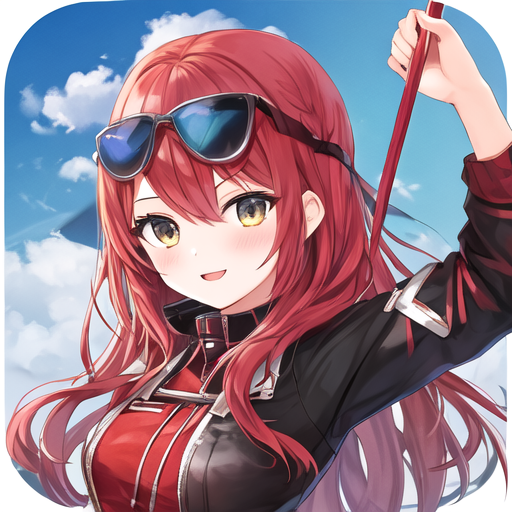
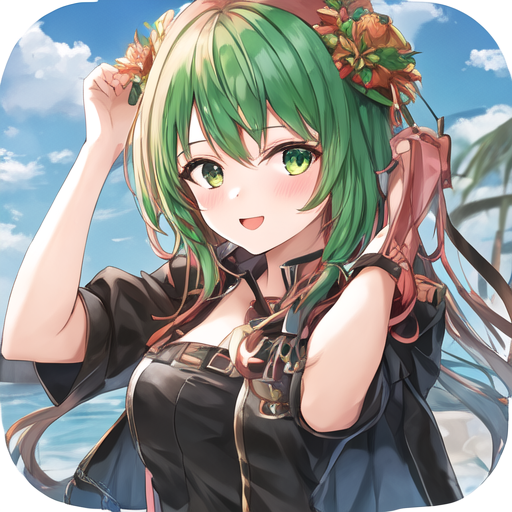
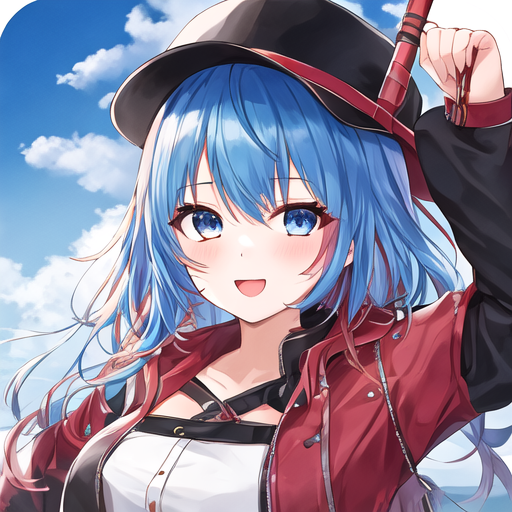
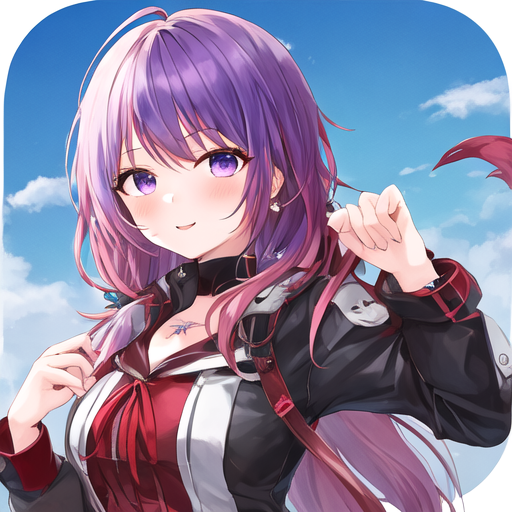
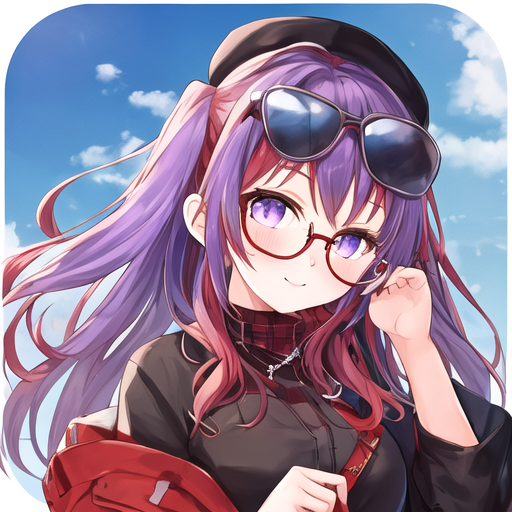

In [15]:
# run StyleAligned

sets_of_prompts = [
  "red haired girl, 1girl, solo, icon, best quality",
  "green haired girl, 1girl, solo, icon, best quality",
  "blue haired girl, 1girl, solo, icon, best quality",
  "purple haired girl, 1girl, solo, icon, best quality",
  "purple haired girl, glasses, 1girl, solo, icon, best quality",
]
set_of_negative_prompts = [
    "longbody, lowres, bad anatomy, bad hands, missing fingers, extra digit, fewer digits, cropped, worst quality, low quality" for i in range(5)
]
images = pipeline(sets_of_prompts, 
                  negative_prompt=set_of_negative_prompts,
                  generator=torch.Generator().manual_seed(40)).images # generator=None, if random
mediapy.show_images(images)

  0%|          | 0/50 [00:00<?, ?it/s]

,,,,

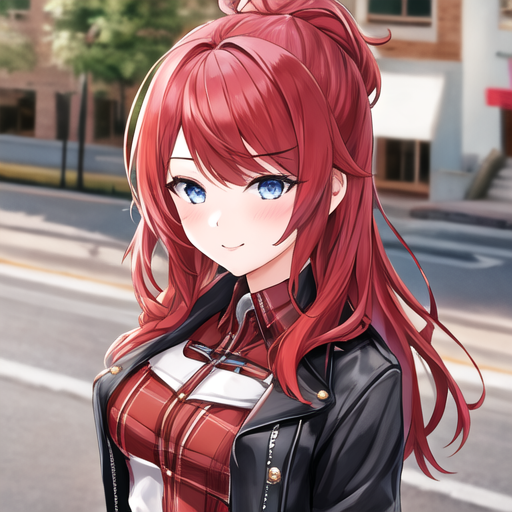
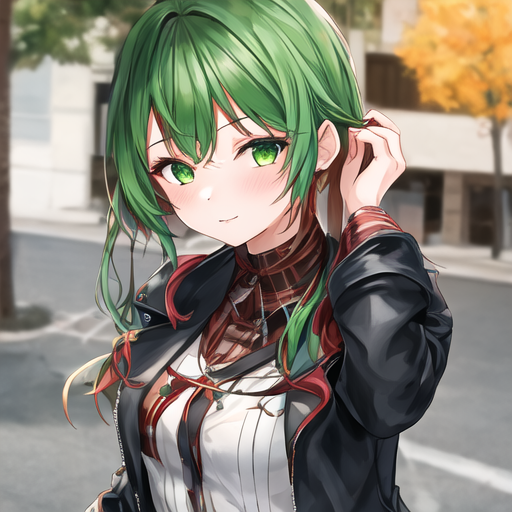
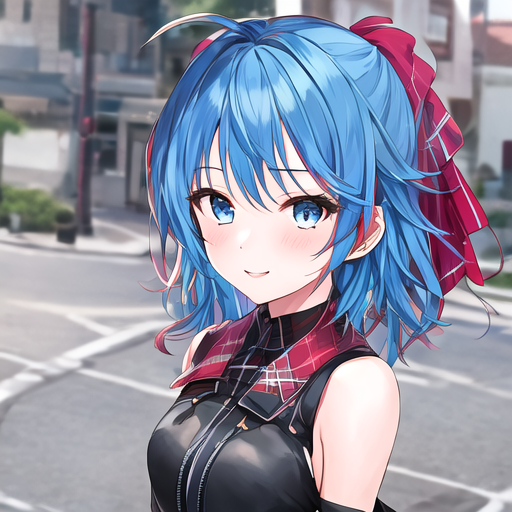
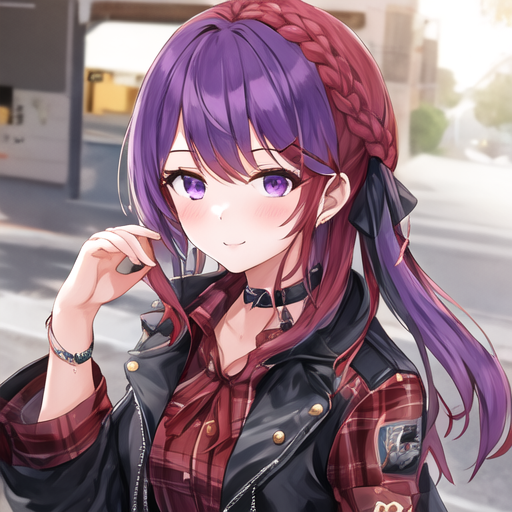
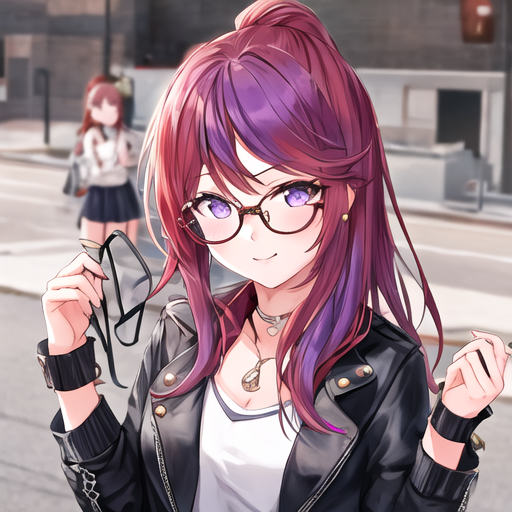

In [16]:
images = pipeline(sets_of_prompts, 
                  negative_prompt=set_of_negative_prompts,
                  generator=None).images # generator=None, if random
mediapy.show_images(images)

# StyleAligned over Anime Pastel Dream

In [17]:
scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False,
                          set_alpha_to_one=False)
pipeline = StableDiffusionPipeline.from_pretrained(
    "sinkinai/anime-pastel-dream-soft-baked-vae",
    scheduler=scheduler,
    safety_checker=None,
    torch_dtype=torch.float16
)

pipeline = pipeline.to("cuda")
pipeline.enable_vae_slicing() # This reduce VRAM 14 -> 8.3GB

handler = sa_handler.Handler(pipeline)
sa_args = sa_handler.StyleAlignedArgs(share_group_norm=True,
                                      share_layer_norm=True,
                                      share_attention=True,
                                      adain_queries=True,
                                      adain_keys=True,
                                      adain_values=False,
                                     )

handler.register(sa_args, )

text_encoder/model.safetensors not found


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/50 [00:00<?, ?it/s]

,,,,

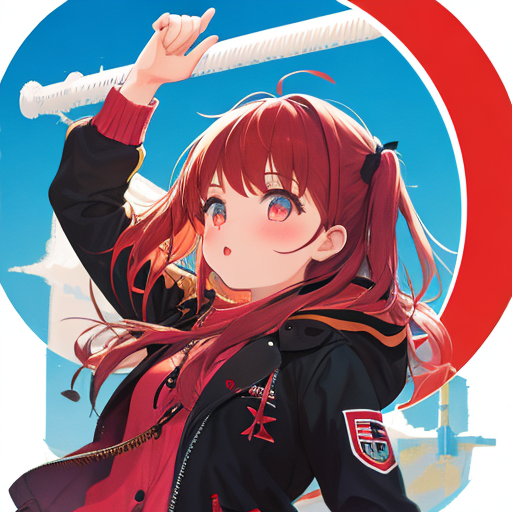
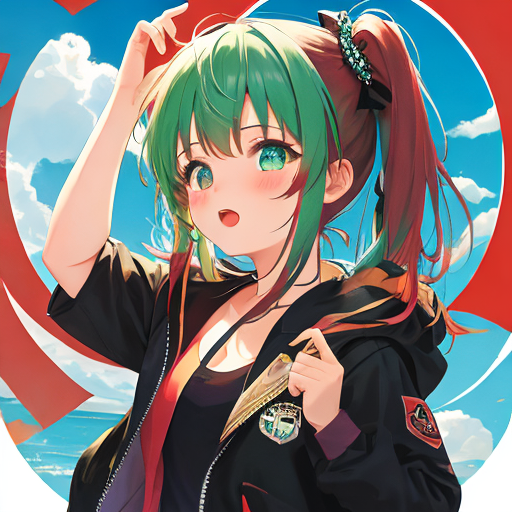
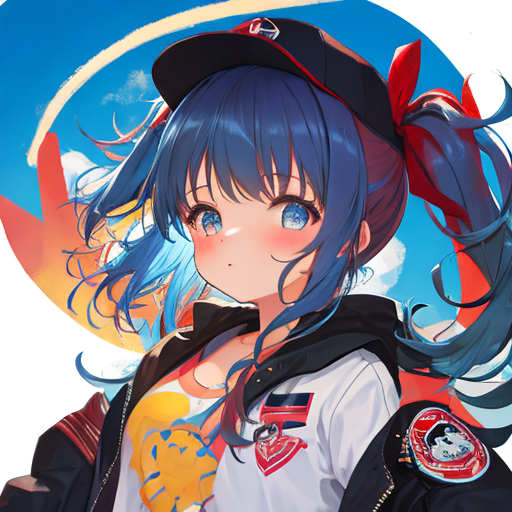
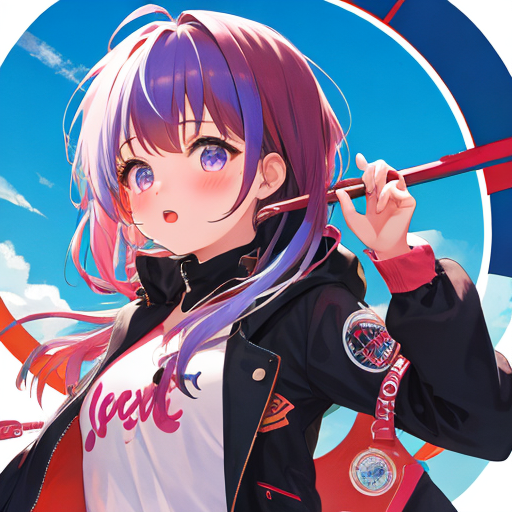
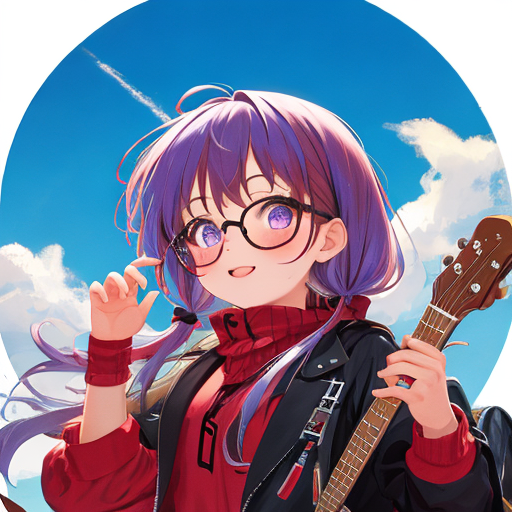

In [18]:
# run StyleAligned

sets_of_prompts = [
  "red haired girl, 1girl, solo, icon, best quality",
  "green haired girl, 1girl, solo, icon, best quality",
  "blue haired girl, 1girl, solo, icon, best quality",
  "purple haired girl, 1girl, solo, icon, best quality",
  "purple haired girl, glasses, 1girl, solo, icon, best quality",
]
set_of_negative_prompts = [
    "longbody, lowres, bad anatomy, bad hands, missing fingers, extra digit, fewer digits, cropped, worst quality, low quality" for i in range(5)
]
images = pipeline(sets_of_prompts, 
                  negative_prompt=set_of_negative_prompts,
                  generator=torch.Generator().manual_seed(40),
                  clip_skip=2).images # generator=None, if random
mediapy.show_images(images)

  0%|          | 0/50 [00:00<?, ?it/s]

,,,,

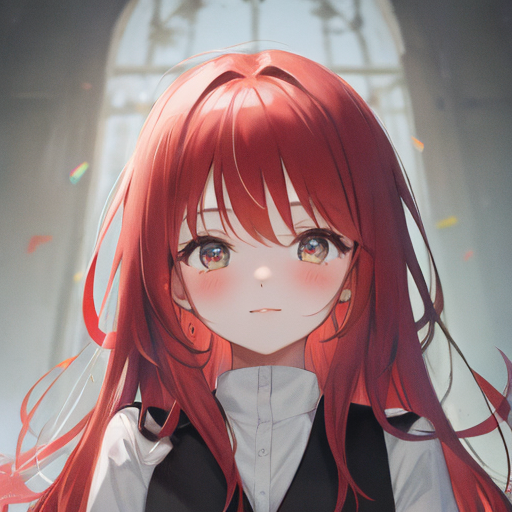
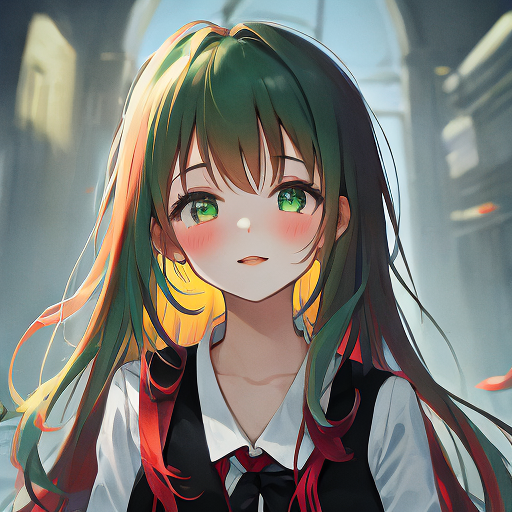
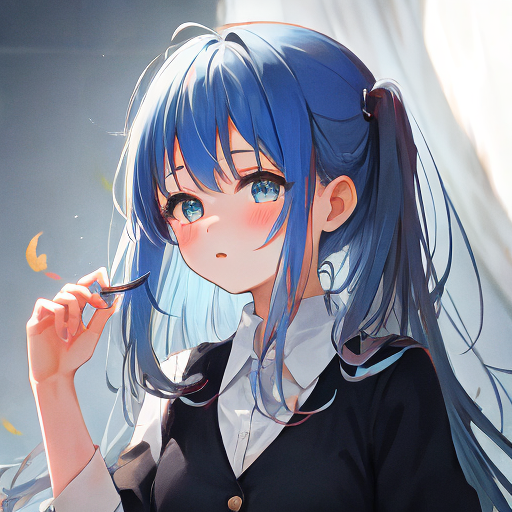
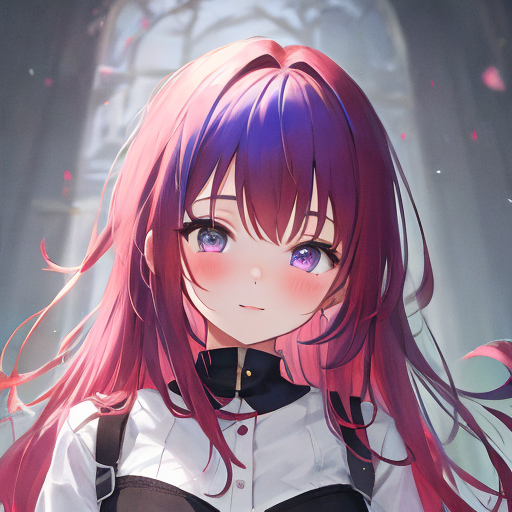
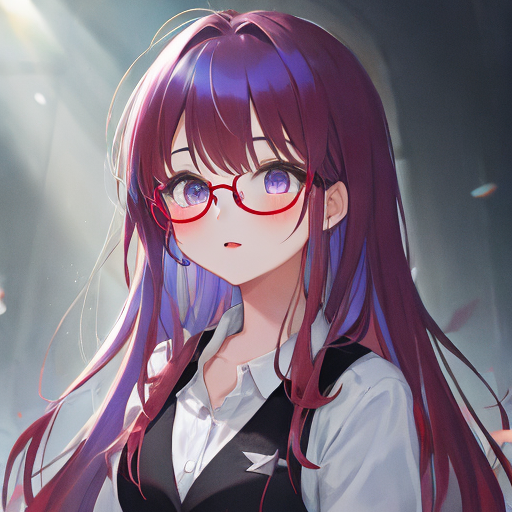

In [19]:
images = pipeline(sets_of_prompts, 
                  negative_prompt=set_of_negative_prompts,
                  generator=None,
                  clip_skip=2).images # generator=None, if random
mediapy.show_images(images)

# StyleAligned over AnythingV5

In [20]:
scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False,
                          set_alpha_to_one=False)
pipeline = StableDiffusionPipeline.from_pretrained(
    "stablediffusionapi/anything-v5",
    scheduler=scheduler,
    safety_checker=None,
    torch_dtype=torch.float16
)

pipeline = pipeline.to("cuda")
pipeline.enable_vae_slicing() # This reduce VRAM 14 -> 8.3GB

handler = sa_handler.Handler(pipeline)
sa_args = sa_handler.StyleAlignedArgs(share_group_norm=True,
                                      share_layer_norm=True,
                                      share_attention=True,
                                      adain_queries=True,
                                      adain_keys=True,
                                      adain_values=False,
                                     )

handler.register(sa_args, )

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/50 [00:00<?, ?it/s]

,,,,

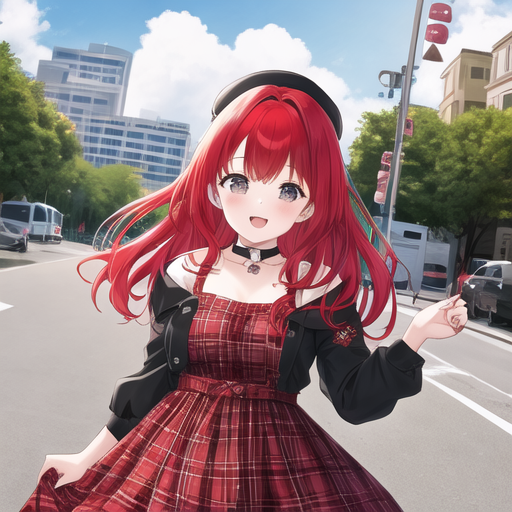
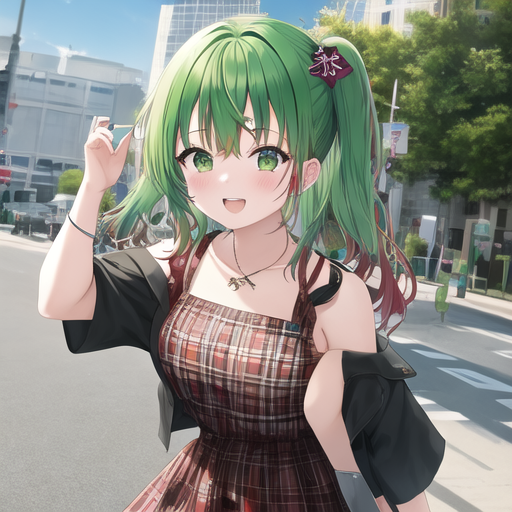
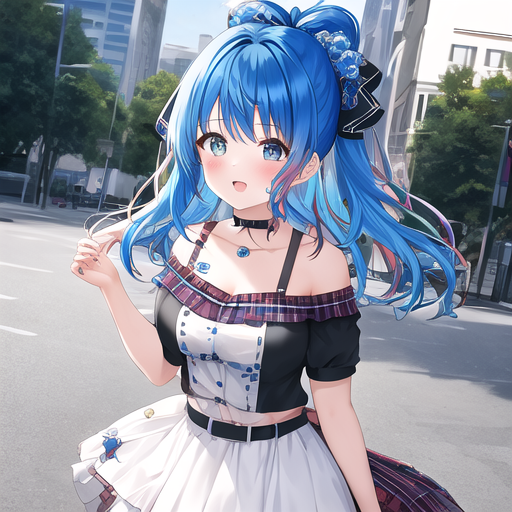
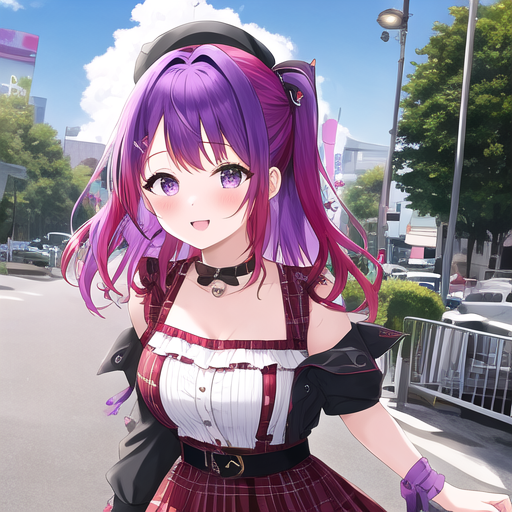
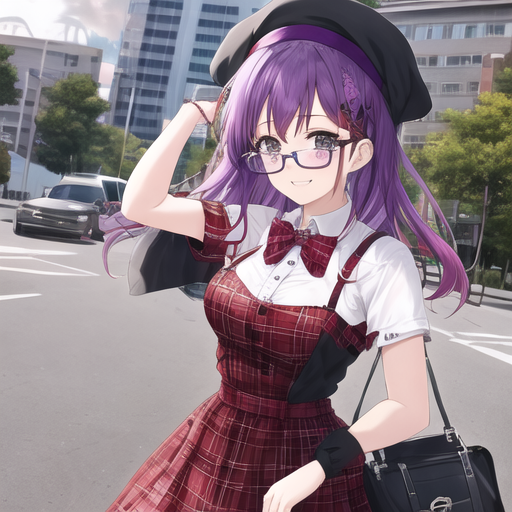

In [21]:
images = pipeline(sets_of_prompts, 
                  negative_prompt=set_of_negative_prompts,
                  generator=torch.Generator().manual_seed(40)).images # generator=None, if random
mediapy.show_images(images)

  0%|          | 0/50 [00:00<?, ?it/s]

,,,,

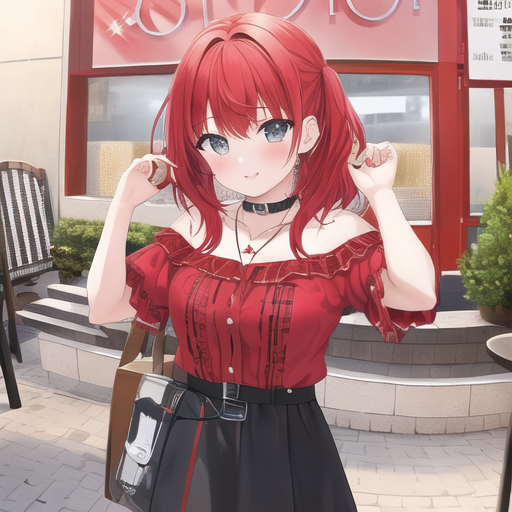
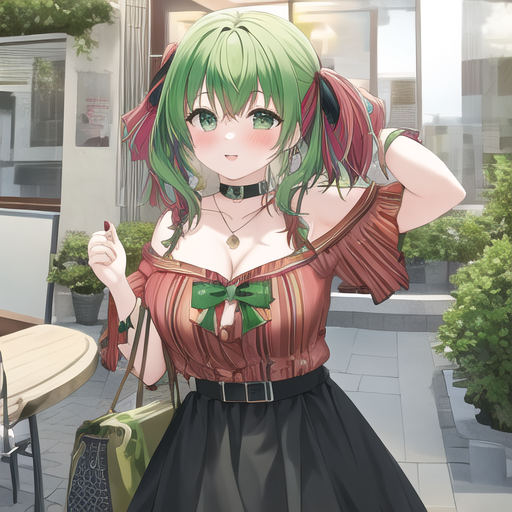
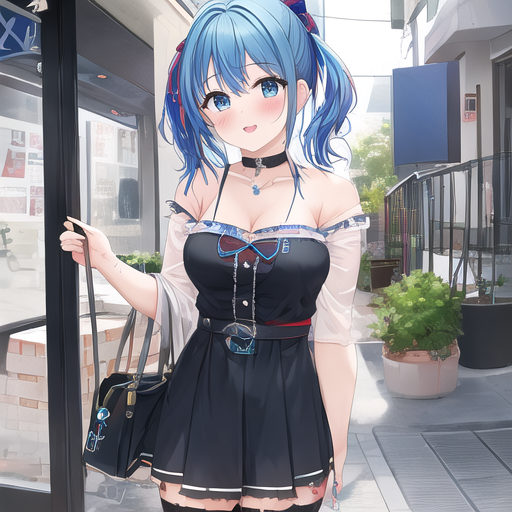
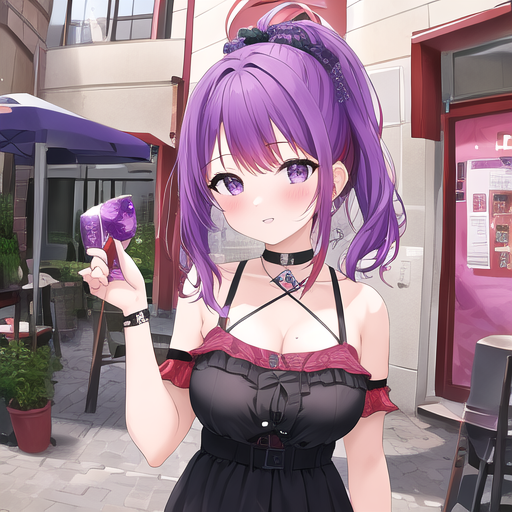
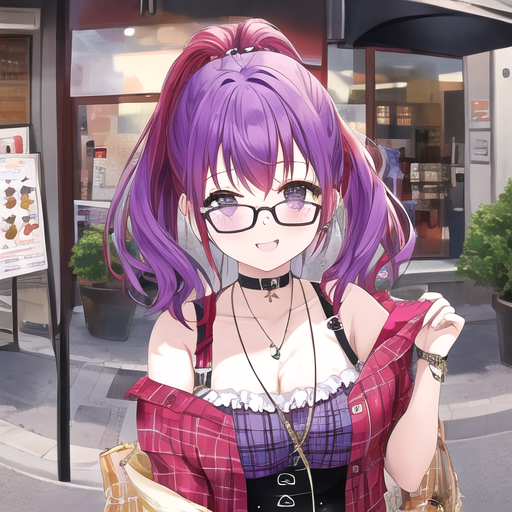

In [22]:
images = pipeline(sets_of_prompts, 
                  negative_prompt=set_of_negative_prompts,
                  generator=None).images # generator=None, if random
mediapy.show_images(images)